In [59]:
import pandas as pd
# Read a single CSV file from the Agra folder
df = pd.read_csv('duplicate_removed.csv')
df.head()

,NAME,PRICE,CUSINE_CATEGORY,CITY,REGION,PAGE NO,CUSINE TYPE,TIMING,RATING_TYPE,RATING,VOTES
0,The Salt Cafe Kitchen & Bar,1000,"North Indian,Continental,Italian",Agra,Tajganj,1,Casual Dining,1130am to 1130pm(Mon-Sun),Excellent,4.8,273
1,Bhagat Halwai,300,"Desserts,Bakery,Fast Food,South Indian",Agra,Civil Lines,1,Quick Bites,730am to 11pm(Mon-Sun),Very Good,4.3,554
2,Bikanervala,700,"North Indian,South Indian,Mithai,Street Food,D...",Agra,Khandari,1,Quick Bites,8am to 11pm(Mon-Sun),Very Good,4.4,645
3,Mama Chicken Mama Franky House,600,"North Indian,Mughlai,Rolls,Chinese,Fast Food,S...",Agra,Agra Cantt,1,Quick Bites,"1230pm to 12midnight(Mon,Wed,Thu,Fri,Sat...",Very Good,4.3,894
4,Honeydew Restaurant,500,"North Indian,Fast Food,Chinese,South Indian",Agra,Dayal Bagh,1,Quick Bites,"11am to 1035pm(Mon,Tue,Wed,Fri,Sat),11am to ...",Very Good,4.1,489


## 1. Distribution of restaurants by price
### Histogram or Bar Chart

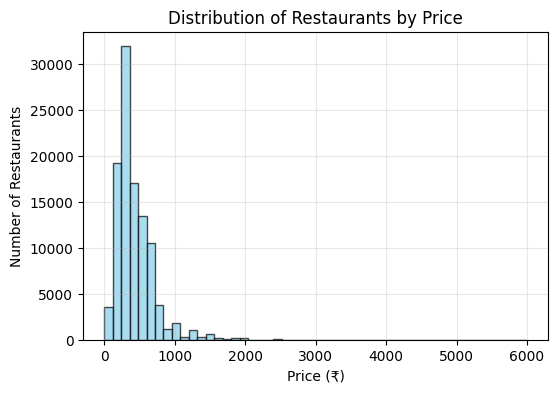

In [60]:
import matplotlib.pyplot as plt

# Histogram for price distribution
plt.figure(figsize=(6, 4))
plt.hist(df['PRICE'], bins=50, alpha=0.7, color='skyblue', edgecolor='black')
plt.title('Distribution of Restaurants by Price')
plt.xlabel('Price (₹)')
plt.ylabel('Number of Restaurants')
plt.grid(True, alpha=0.3)
plt.show()


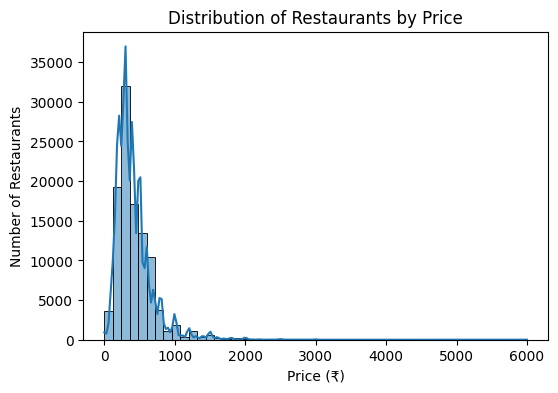

In [61]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='PRICE', bins=50, kde=True)
plt.title('Distribution of Restaurants by Price')
plt.xlabel('Price (₹)')
plt.ylabel('Number of Restaurants')
plt.show()


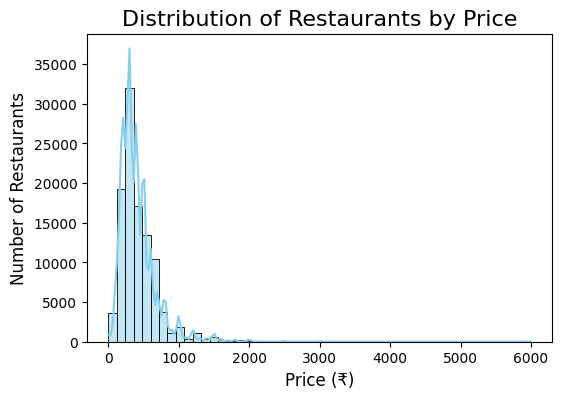

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(6, 4))
sns.histplot(data=df, x='PRICE', bins=50, kde=True, color='skyblue')
plt.title('Distribution of Restaurants by Price', fontsize=16)
plt.xlabel('Price (₹)', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_12964\1630736377.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




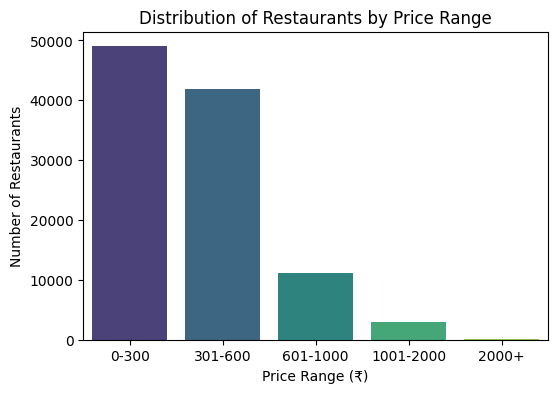

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create price ranges for better visualization
df['price_range'] = pd.cut(df['PRICE'], bins=[0, 300, 600, 1000, 2000, float('inf')], 
                          labels=['0-300', '301-600', '601-1000', '1001-2000', '2000+'])

plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='price_range', palette='viridis')
plt.title('Distribution of Restaurants by Price Range')
plt.xlabel('Price Range (₹)')
plt.ylabel('Number of Restaurants')
plt.show()


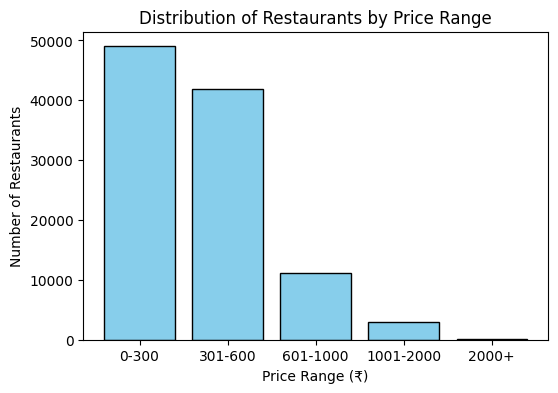

In [64]:
import matplotlib.pyplot as plt

# Create price ranges
df['price_range'] = pd.cut(df['PRICE'], bins=[0, 300, 600, 1000, 2000, float('inf')], 
                          labels=['0-300', '301-600', '601-1000', '1001-2000', '2000+'])

price_counts = df['price_range'].value_counts()

plt.figure(figsize=(6, 4))
plt.bar(price_counts.index, price_counts.values, color='skyblue', edgecolor='black')
plt.title('Distribution of Restaurants by Price Range')
plt.xlabel('Price Range (₹)')
plt.ylabel('Number of Restaurants')
plt.show()


## 2. Popularity of different cuisine categories
### Bar Chart or Treemap

C:\Users\Admin\AppData\Local\Temp\ipykernel_12964\184201189.py:8: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




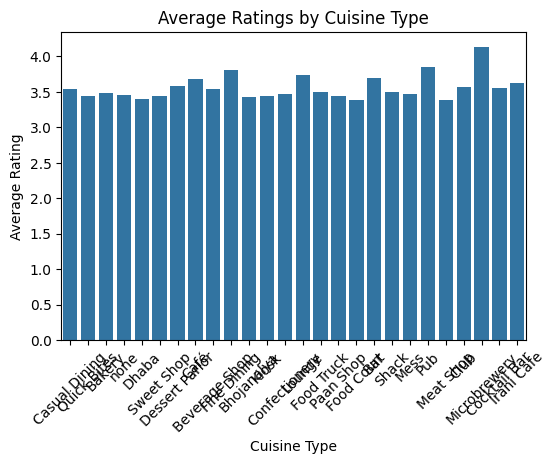

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert RATING to numeric
df['RATING'] = pd.to_numeric(df['RATING'], errors='coerce')

plt.figure(figsize=(6, 4))
sns.barplot(data=df, x='CUSINE TYPE', y='RATING', ci=None)
plt.title('Average Ratings by Cuisine Type')
plt.xlabel('Cuisine Type')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.show()


In [66]:
import plotly.express as px

# Group by cuisine type and calculate average rating
cuisine_ratings = df.groupby('CUSINE TYPE').agg({
    'RATING': 'mean',
    'NAME': 'count'
}).reset_index()
cuisine_ratings.columns = ['Cuisine_Type', 'Avg_Rating', 'Count']

# Create treemap
fig = px.treemap(cuisine_ratings, 
                 path=['Cuisine_Type'], 
                 values='Count',
                 color='Avg_Rating',
                 title='Restaurant Count and Average Rating by Cuisine Type')
fig.show()


## 3. Ratings comparison by cuisine type or region
### Box Plot or Violin Plot

In [67]:
import plotly.express as px

# Convert RATING to numeric
df['RATING'] = pd.to_numeric(df['RATING'], errors='coerce')

fig = px.box(df, x='CUSINE TYPE', y='RATING', 
             title='Rating Distribution by Cuisine Type')
fig.update_xaxes(tickangle=45)
fig.show()


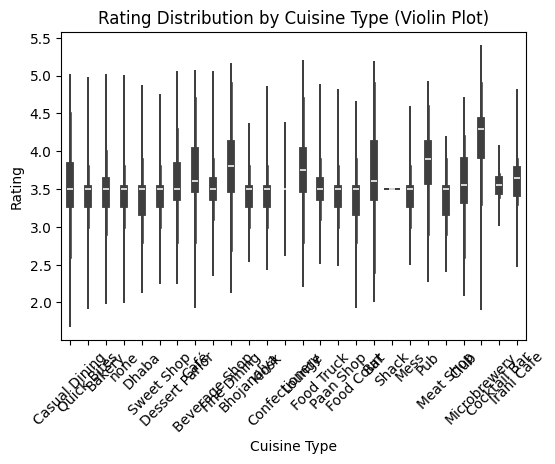

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert RATING to numeric
df['RATING'] = pd.to_numeric(df['RATING'], errors='coerce')

plt.figure(figsize=(6, 4))
sns.violinplot(data=df, x='CUSINE TYPE', y='RATING')
plt.title('Rating Distribution by Cuisine Type (Violin Plot)')
plt.xlabel('Cuisine Type')
plt.ylabel('Rating')
plt.xticks(rotation=45)
plt.show()


## 4. Restaurant popularity by votes
### Bar Chart (sorted) or Scatter Plot

In [69]:
import plotly.express as px

# Sort by votes in descending order and take top 10
top_restaurants = df.nlargest(10, 'VOTES')

fig = px.bar(top_restaurants, 
             x='VOTES', 
             y='NAME',
             orientation='h',
             title='Top 10 Most Popular Restaurants by Votes')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()


In [70]:
import plotly.express as px

# Convert RATING to numeric
df['RATING'] = pd.to_numeric(df['RATING'], errors='coerce')

fig = px.scatter(df, x='VOTES', y='RATING', 
                 hover_name='NAME',
                 color='CUSINE TYPE',
                 size='PRICE',
                 title='Restaurant Popularity: Votes vs Rating')
fig.show()


## 5. Average rating by region or cuisine type
### Bar Chart or Heatmap

In [71]:
# Average rating by region
region_avg = df.groupby('REGION')['RATING'].mean().reset_index()
fig1 = px.bar(region_avg, x='REGION', y='RATING', title='Average Rating by Region')
fig1.show()

# Average rating by cuisine type
cuisine_avg = df.groupby('CUSINE TYPE')['RATING'].mean().reset_index()
fig2 = px.bar(cuisine_avg, x='CUSINE TYPE', y='RATING', title='Average Rating by Cuisine Type')
fig2.show()

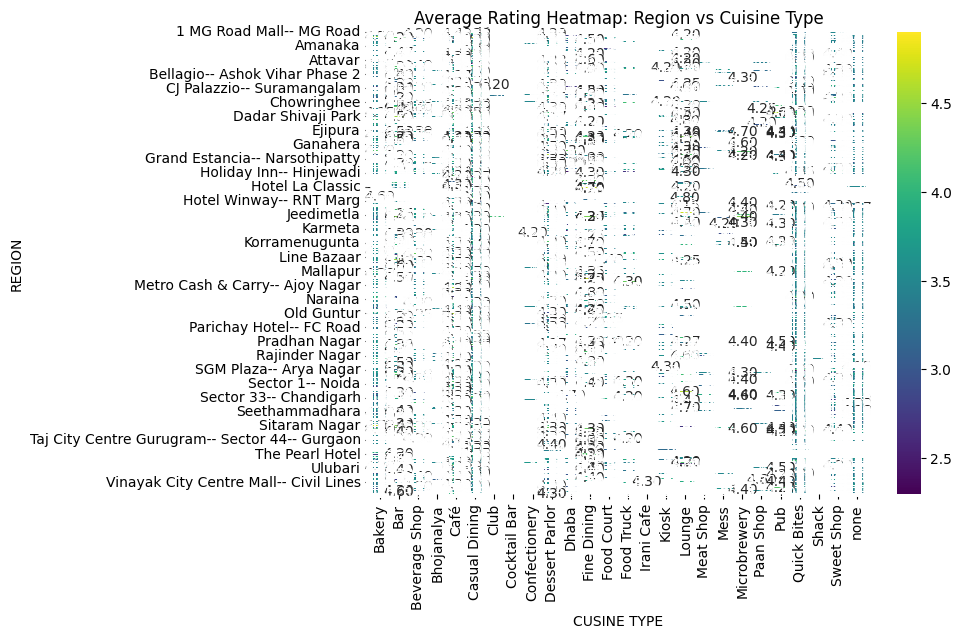

In [72]:
# Create pivot table for heatmap
pivot_table = df.pivot_table(values='RATING', index='REGION', columns='CUSINE TYPE', aggfunc='mean')

# Plotly Heatmap
fig1 = px.imshow(pivot_table, text_auto=True, aspect="auto", 
                 title="Average Rating Heatmap: Region vs Cuisine Type")
fig1.show()

# Seaborn Heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(pivot_table, annot=True, cmap='viridis', fmt='.2f')
plt.title('Average Rating Heatmap: Region vs Cuisine Type')
plt.show()


## 6. Breakdown by restaurant type
### Pie Chart or Donut Chart

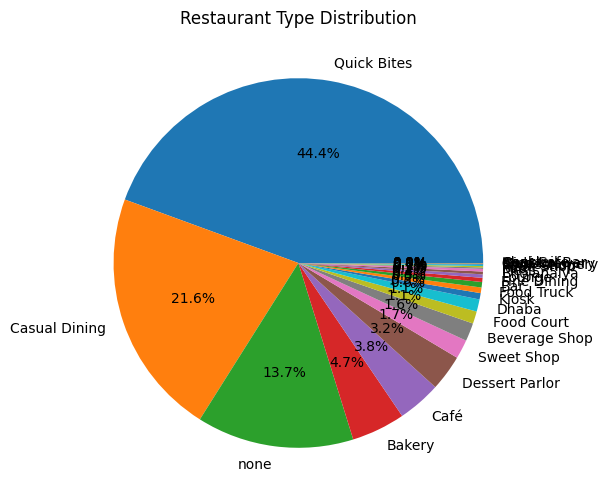

In [73]:
# Restaurant type distribution
type_counts = df['CUSINE TYPE'].value_counts()

# Plotly Pie Chart
fig1 = px.pie(values=type_counts.values, names=type_counts.index, 
              title="Restaurant Type Distribution")
fig1.show()

# Seaborn Pie Chart
plt.figure(figsize=(8, 6))
plt.pie(type_counts.values, labels=type_counts.index, autopct='%1.1f%%')
plt.title('Restaurant Type Distribution')
plt.show()


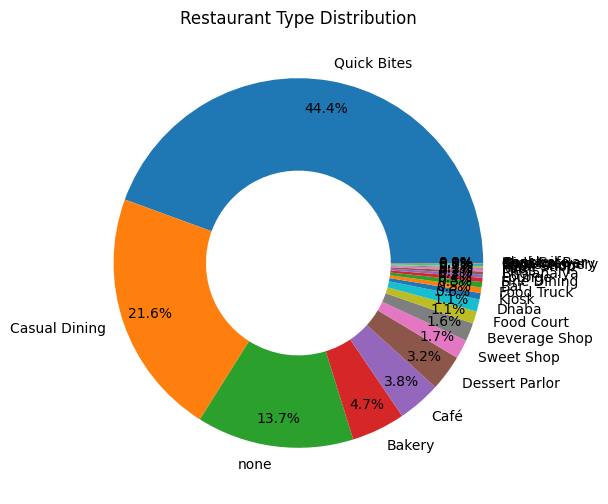

In [74]:
# Restaurant type distribution
type_counts = df['CUSINE TYPE'].value_counts()

# Plotly Donut Chart
fig = px.pie(values=type_counts.values, names=type_counts.index, 
             title="Restaurant Type Distribution", hole=0.4)
fig.show()

# Matplotlib Donut Chart
plt.figure(figsize=(8, 6))
plt.pie(type_counts.values, labels=type_counts.index, autopct='%1.1f%%', 
        pctdistance=0.85, wedgeprops=dict(width=0.5))
plt.title('Restaurant Type Distribution')
plt.show()


## 7. Operating hours distribution
### Histogram or Line Chart (over time)

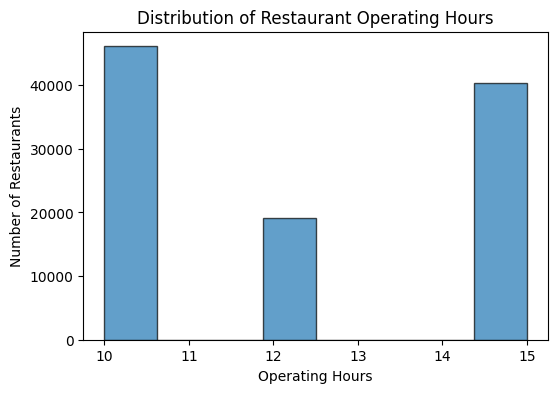

In [75]:
# Extract operating hours (simplified approach)
import re

def extract_hours(timing):
    # Extract start and end times, calculate duration
    if 'midnight' in timing.lower():
        return 12  # Approximate for midnight closings
    elif '11pm' in timing.lower():
        return 15  # Approximate for 11pm closings
    elif '1130pm' in timing.lower():
        return 12  # Approximate for 11:30pm closings
    else:
        return 10  # Default approximation

df['operating_hours'] = df['TIMING'].apply(extract_hours)

# Histogram of operating hours
plt.figure(figsize=(6, 4))
plt.hist(df['operating_hours'], bins=8, edgecolor='black', alpha=0.7)
plt.xlabel('Operating Hours')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Restaurant Operating Hours')
plt.show()


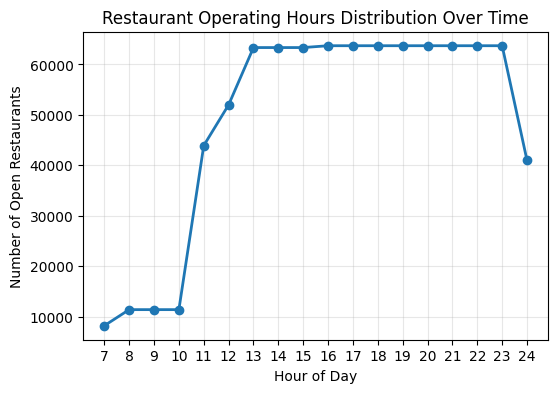

In [76]:
# Create hourly activity data (restaurants open at each hour)
hours = list(range(7, 25))  # 7am to 12am (midnight)
open_count = []

for hour in hours:
    count = 0
    for timing in df['TIMING']:
        # Simple parsing logic for demonstration
        if ('7' in timing and hour >= 7) or ('8am' in timing and hour >= 8) or \
           ('11am' in timing and hour >= 11) or ('12noon' in timing and hour >= 12) or \
           ('1pm' in timing and hour >= 13) or ('4pm' in timing and hour >= 16):
            if ('11pm' in timing and hour <= 23) or ('1130pm' in timing and hour <= 23) or \
               ('1155pm' in timing and hour <= 23) or ('midnight' in timing and hour <= 24) or \
               ('1am' in timing and hour <= 25):
                count += 1
    open_count.append(count)

# Line chart
plt.figure(figsize=(6, 4))
plt.plot(hours, open_count, marker='o', linewidth=2, markersize=6)
plt.xlabel('Hour of Day')
plt.ylabel('Number of Open Restaurants')
plt.title('Restaurant Operating Hours Distribution Over Time')
plt.grid(True, alpha=0.3)
plt.xticks(hours)
plt.show()


## 8. Number of restaurants by region
### Bar Chart or Map Visualization

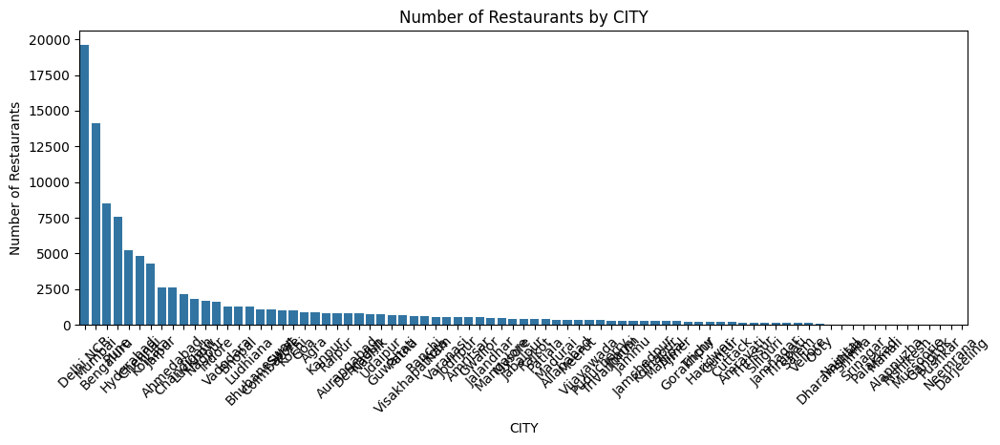

In [77]:
# Count restaurants by city
city_counts = df['CITY'].value_counts()

# Plotly Bar Chart
fig = px.bar(x=city_counts.index, y=city_counts.values, 
             title="Number of Restaurants by CITY")
fig.update_xaxes(title="CITY")
fig.update_yaxes(title="Number of Restaurants")
fig.show()

# Seaborn Bar Chart
plt.figure(figsize=(12, 4))
sns.barplot(x=city_counts.index, y=city_counts.values)
plt.xlabel('CITY')
plt.ylabel('Number of Restaurants')
plt.title('Number of Restaurants by CITY')
plt.xticks(rotation=45)
plt.show()


In [78]:
# Count restaurants by region
region_counts = df['REGION'].value_counts().reset_index()
region_counts.columns = ['Region', 'Count']

# Add mock coordinates for regions (since we don't have actual coordinates)
region_coords = {
    'Civil Lines': [27.1767, 78.0081],
    'Tajganj': [27.1751, 78.0421], 
    'Khandari': [27.1833, 78.0167],
    'Agra Cantt': [27.1592, 77.9629],
    'Dayal Bagh': [27.2046, 78.0479]
}

region_counts['lat'] = region_counts['Region'].map(lambda x: region_coords.get(x, [27.18, 78.02])[0])
region_counts['lon'] = region_counts['Region'].map(lambda x: region_coords.get(x, [27.18, 78.02])[1])

# Plotly Map Visualization
fig = px.scatter_mapbox(region_counts, lat='lat', lon='lon', size='Count',
                        hover_name='Region', hover_data=['Count'],
                        mapbox_style='open-street-map', zoom=11,
                        title='Number of Restaurants by Region')
fig.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_12964\2973372581.py:18: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

